<a href="https://colab.research.google.com/github/ssaine95/CoderHouseDataScience/blob/main/Proyecto_Final%2BSantiagoSaine.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Preguntas de interés**

---



### **Preguntas principales o primarias**
* ¿Qué debemos tener en cuenta a la hora de contratar un jugador si tenemos un presupuesto ajustado y buscamos que nuestro equipo mejore?
* ¿Qué debemos tener en cuenta si queremos obtener una mayor ganancia en el club con la compra venta de jugadores?

### **Preguntas secundarias (nos ayudaran a contestar las principales)**
* ¿Cuáles son las habilidades más importantes a tener en cuenta de un jugador?
* ¿Cuáles son las habilidades que deben mejorar nuestros jugadores para tener un mayor valor de mercado?
* ¿Qué edad es la ideal para contratar a un jugador?
* ¿Cuáles son las posiciones de mayor valor de mercado?
* ¿Cuáles son las posiciones que más abundan en el mercado?
* ¿Qué valor de mercado en promedio tienen los jugadores según su overall?

##**1. Abstracto**

El conjunto de datos de FIFA Stats contiene información detallada sobre jugadores. Este conjunto de datos puede utilizarse para analizar el rendimiento de los jugadores, construir un equipo ideal u obtener información sobre las estadísticas de los jugadores.

Se busca identificar, en base a los datos, las distintas valorizaciones de cada jugador en sus distintas posiciones valorando costos,
características físicas y estadísticas potenciales de los mismos.

Particularmente, nosotros como Club queremos analizar el conjunto de datos con el fin de tomar las decisiones correctas a la hora de contratar nuevos jugadores para nuestra institución. Analizaremos diversas variables, definiendo aquellas que creamos más importantes que puedan ayudarnos en el proceso de selección.


####Explicación de Variables TOP (actualizada al 2020 la base)
* short_name: Nombre abreviado de los jugadores de fútbol.
* age: Edad de los jugadores de fútbol.
* overall: Puntuación de la calidad de los jugadores de fútbol.
* value_eur (Variable Target): Valor de mercado en euros de los jugadores de fútbol. Se buscará predecir los valores de mercado de los jugadores jóvenes sub22 a 5 años.
* age_eur (Variable Target): Salario mensual de los jugadores de fútbol. Se buscará predecir los salarios de los jugadores jóvenes sub22 a 5 años.

## **2. Importación del Dataset**

In [ ]:
! pip install chart_studio
! pip install bqplot
! pip install pingouin



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.4/64.4 kB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 198.9/198.9 kB 4.2 MB/s eta 0:00:00


In [ ]:
import statsmodels.api as sm
import pandas as pd
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from   scipy import stats
import numpy as np
import statsmodels.formula.api as sm
import chart_studio.plotly as py
import os

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd '/content/drive/MyDrive/Coderhouse'
df3 = pd.read_excel('footballData2.xlsx')
print(df3)

/content/drive/MyDrive/Coderhouse
       sofifa_id         short_name                            long_name  age  \
0         158023           L. Messi      Lionel AndrÃ©s Messi Cuccittini   33   
1          20801  Cristiano Ronaldo  Cristiano Ronaldo dos Santos Aveiro   35   
2         200389           J. Oblak                            Jan Oblak   27   
3         188545     R. Lewandowski                   Robert Lewandowski   31   
4         190871          Neymar Jr       Neymar da Silva Santos JÃºnior   28   
...          ...                ...                                  ...  ...   
18714     256679          K. Angulo                         Kevin Angulo   24   
18715     257710     Zhang Mengxuan                       Mengxuan Zhang   21   
18716     250989      Wang Zhenghao                            çŽ‹æ”¿è±ª   20   
18717     257697        Chen Zitong                          Zitong Chen   23   
18718     257936           Song Yue                             Yue Song   

In [ ]:
df3.head()

,sofifa_id,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club_name,league_name,...,gk_speed,gk_positioning,attacking_finishing,skill_dribbling,movement_acceleration,movement_sprint_speed,power_shot_power,mentality_aggression,defending_standing_tackle,goalkeeping_handling
0,158023,L. Messi,Lionel AndrÃ©s Messi Cuccittini,33,1987-06-24,170,72,Argentina,FC Barcelona,Spain Primera Division,...,0,0,95,96,91,80,86,44,35,11
1,20801,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,35,1985-02-05,187,83,Portugal,Juventus,Italian Serie A,...,0,0,95,88,87,91,94,63,32,11
2,200389,J. Oblak,Jan Oblak,27,1993-01-07,188,87,Slovenia,AtlÃ©tico Madrid,Spain Primera Division,...,52,90,11,12,43,60,59,34,12,92
3,188545,R. Lewandowski,Robert Lewandowski,31,1988-08-21,184,80,Poland,FC Bayern MÃ¼nchen,German 1. Bundesliga,...,0,0,94,85,77,78,89,81,42,6
4,190871,Neymar Jr,Neymar da Silva Santos JÃºnior,28,1992-02-05,175,68,Brazil,Paris Saint-Germain,French Ligue 1,...,0,0,87,95,94,89,80,51,30,9


In [ ]:
df3.columns

Index(['sofifa_id', 'short_name', 'long_name', 'age', 'dob', 'height_cm',
       'weight_kg', 'nationality', 'club_name', 'league_name', 'league_rank',
       'overall', 'potential', 'value_eur', 'wage_eur', 'player_positions',
       'player_positions2', 'position_segment', 'position_desc',
       'preferred_foot', 'international_reputation', 'weak_foot',
       'skill_moves', 'work_rate', 'body_type', 'real_face',
       'release_clause_eur', 'team_position', 'team_jersey_number',
       'loaned_from', 'joined', 'contract_valid_until', 'nation_position',
       'nation_jersey_number', 'pace', 'shooting', 'passing', 'dribbling',
       'defending', 'physic', 'gk_diving', 'gk_handling', 'gk_kicking',
       'gk_reflexes', 'gk_speed', 'gk_positioning', 'attacking_finishing',
       'skill_dribbling', 'movement_acceleration', 'movement_sprint_speed',
       'power_shot_power', 'mentality_aggression', 'defending_standing_tackle',
       'goalkeeping_handling'],
      dtype='object')

In [ ]:
print(df3.dtypes)

sofifa_id                             int64
short_name                           object
long_name                            object
age                                   int64
dob                          datetime64[ns]
height_cm                             int64
weight_kg                             int64
nationality                          object
club_name                            object
league_name                          object
league_rank                           int64
overall                               int64
potential                             int64
value_eur                             int64
wage_eur                              int64
player_positions                     object
player_positions2                    object
position_segment                     object
position_desc                        object
preferred_foot                       object
international_reputation              int64
weak_foot                             int64
skill_moves                     

In [ ]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18719 entries, 0 to 18718
Data columns (total 54 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   sofifa_id                  18719 non-null  int64         
 1   short_name                 18719 non-null  object        
 2   long_name                  18719 non-null  object        
 3   age                        18719 non-null  int64         
 4   dob                        18719 non-null  datetime64[ns]
 5   height_cm                  18719 non-null  int64         
 6   weight_kg                  18719 non-null  int64         
 7   nationality                18719 non-null  object        
 8   club_name                  18719 non-null  object        
 9   league_name                18719 non-null  object        
 10  league_rank                18719 non-null  int64         
 11  overall                    18719 non-null  int64         
 12  pote

## **3. Data Wrangling**

### 3.1. Verificación y eliminación de nulos

In [ ]:
df3.isnull().values.any()

True

In [ ]:
df3.isnull().sum()

sofifa_id                        0
short_name                       0
long_name                        0
age                              0
dob                              0
height_cm                        0
weight_kg                        0
nationality                      0
club_name                        0
league_name                      0
league_rank                      0
overall                          0
potential                        0
value_eur                        0
wage_eur                         0
player_positions                 0
player_positions2                0
position_segment                 0
position_desc                    0
preferred_foot                   0
international_reputation         0
weak_foot                        0
skill_moves                      0
work_rate                        0
body_type                        0
real_face                        0
release_clause_eur               0
team_position                    0
team_jersey_number  

In [ ]:
sum(df3.isnull().sum())

35643

In [ ]:
percent_missing = df3.isnull().sum() * 100 / len(df3)
missing_value_df = pd.DataFrame({'Columnas': df3.columns,
                                 'Porcentaje_Missing': percent_missing})
missing_value_df

In [ ]:
missing_value_df_f=missing_value_df[missing_value_df['Porcentaje_Missing']<=50]
missing_value_df_f

,Columnas,Porcentaje_Missing
sofifa_id,sofifa_id,0.000000
short_name,short_name,0.000000
long_name,long_name,0.000000
age,age,0.000000
dob,dob,0.000000
height_cm,height_cm,0.000000
weight_kg,weight_kg,0.000000
nationality,nationality,0.000000
club_name,club_name,0.000000
league_name,league_name,0.000000


In [ ]:
lista_variables=list(missing_value_df_f.Columnas)
print(type(lista_variables))
print(len(lista_variables))
lista_variables

<class 'list'>
52


['sofifa_id',
 'short_name',
 'long_name',
 'age',
 'dob',
 'height_cm',
 'weight_kg',
 'nationality',
 'club_name',
 'league_name',
 'league_rank',
 'overall',
 'potential',
 'value_eur',
 'wage_eur',
 'player_positions',
 'player_positions2',
 'position_segment',
 'position_desc',
 'preferred_foot',
 'international_reputation',
 'weak_foot',
 'skill_moves',
 'work_rate',
 'body_type',
 'real_face',
 'release_clause_eur',
 'team_position',
 'team_jersey_number',
 'loaned_from',
 'joined',
 'contract_valid_until',
 'pace',
 'shooting',
 'passing',
 'dribbling',
 'defending',
 'physic',
 'gk_diving',
 'gk_handling',
 'gk_kicking',
 'gk_reflexes',
 'gk_speed',
 'gk_positioning',
 'attacking_finishing',
 'skill_dribbling',
 'movement_acceleration',
 'movement_sprint_speed',
 'power_shot_power',
 'mentality_aggression',
 'defending_standing_tackle',
 'goalkeeping_handling']

In [ ]:
df3_x=df3.loc[:, df3.columns.isin(lista_variables)]
df3_x

,sofifa_id,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club_name,league_name,...,gk_speed,gk_positioning,attacking_finishing,skill_dribbling,movement_acceleration,movement_sprint_speed,power_shot_power,mentality_aggression,defending_standing_tackle,goalkeeping_handling
0,158023,L. Messi,Lionel AndrÃ©s Messi Cuccittini,33,1987-06-24,170,72,Argentina,FC Barcelona,Spain Primera Division,...,0,0,95,96,91,80,86,44,35,11
1,20801,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,35,1985-02-05,187,83,Portugal,Juventus,Italian Serie A,...,0,0,95,88,87,91,94,63,32,11
2,200389,J. Oblak,Jan Oblak,27,1993-01-07,188,87,Slovenia,AtlÃ©tico Madrid,Spain Primera Division,...,52,90,11,12,43,60,59,34,12,92
3,188545,R. Lewandowski,Robert Lewandowski,31,1988-08-21,184,80,Poland,FC Bayern MÃ¼nchen,German 1. Bundesliga,...,0,0,94,85,77,78,89,81,42,6
4,190871,Neymar Jr,Neymar da Silva Santos JÃºnior,28,1992-02-05,175,68,Brazil,Paris Saint-Germain,French Ligue 1,...,0,0,87,95,94,89,80,51,30,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18714,256679,K. Angulo,Kevin Angulo,24,1996-04-13,176,73,Colombia,AmÃ©rica de Cali,Colombian Liga PostobÃ³n,...,0,0,37,44,64,62,43,57,39,9
18715,257710,Zhang Mengxuan,Mengxuan Zhang,21,1999-04-26,177,70,China PR,Chongqing Dangdai Lifan FC SWM Team,Chinese Super League,...,0,0,16,19,60,56,35,44,56,13
18716,250989,Wang Zhenghao,çŽ‹æ”¿è±ª,20,2000-06-28,185,74,China PR,Tianjin TEDA FC,Chinese Super League,...,0,0,20,35,54,49,35,46,55,9
18717,257697,Chen Zitong,Zitong Chen,23,1997-02-20,186,80,China PR,Shijiazhuang Ever Bright F.C.,Chinese Super League,...,0,0,32,45,62,60,45,56,49,7


### 3.2. Verificación y eliminación de duplicados

In [ ]:
print(df3.shape)
df= df3.drop_duplicates()
print(df.shape)

(18719, 54)
(18719, 54)


## **4. Análisis General de los Jugadores**

#### 4.1. Cantidad de Jugadores por Edad

Text(0, 0.5, 'Cant. Jugadores')

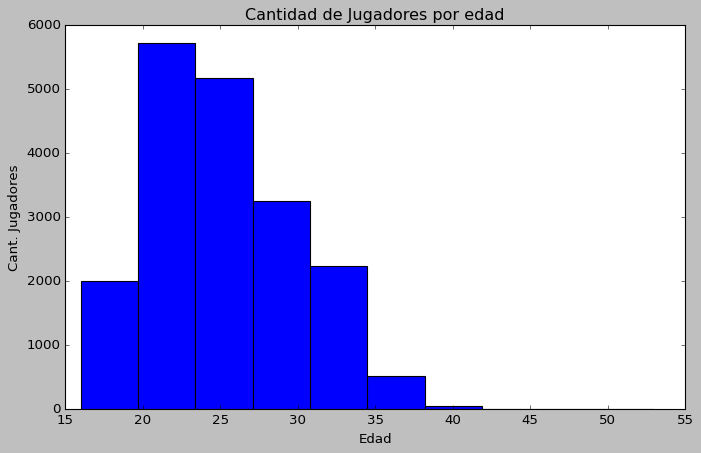

In [ ]:
mpl.style.use('classic')
plt.figure(figsize=(10,6))
plt.hist(x= df3.age, bins=None, density=False, orientation='vertical')
plt.title('Cantidad de Jugadores por edad')
plt.xlabel('Edad')
plt.ylabel('Cant. Jugadores')

El gráfico muestra que la mayor cantidad de jugadores tienen entre 20 y 25 años.

#### 4.2. Cantidad de Jugadores por pie hábil

Text(0.5, 1.0, 'Cantidad de Jugadores por pie hábil')

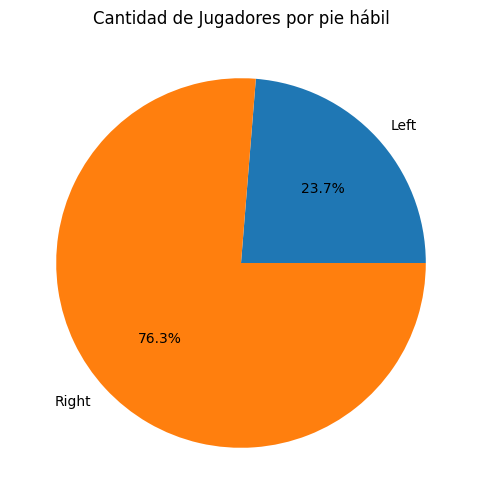

In [ ]:
group_foot=df3[['sofifa_id','preferred_foot']].groupby(by='preferred_foot').count()
fig,ax = plt.subplots(figsize =(10, 6))
ax.pie(group_foot.sofifa_id, labels = group_foot.index,autopct='%1.1f%%')
ax.set_title('Cantidad de Jugadores por pie hábil')

El gráfico muestra que la mayor cantidad de jugadores tiene como su pierna hábil la derecha.

#### 4.3. Altura vs. Peso de Jugadores

Text(0, 0.5, 'Peso (kg.)')

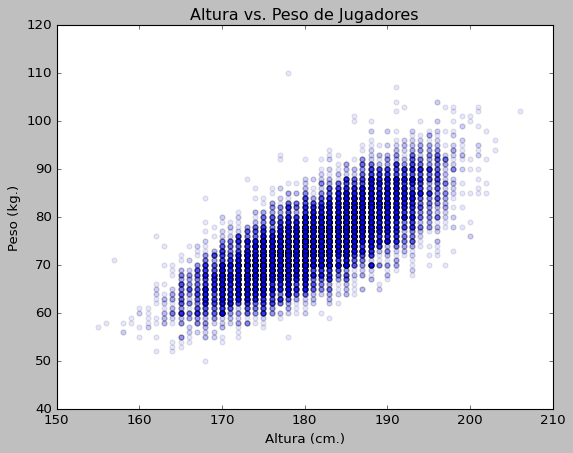

In [ ]:
fig, ax = plt.subplots()
ax.scatter(df3.height_cm, df3.weight_kg, alpha=0.1)
ax.set_title('Altura vs. Peso de Jugadores')
ax.set_xlabel('Altura (cm.)')
ax.set_ylabel('Peso (kg.)')

El gráfico muestra que la mayor cantidad de jugadores mide entre 165 cm y 190 cm y pesa entre 65kg y 85kg.

In [ ]:
df3.index = df3['dob']


#### 4.4. Cantidad de Jugadores por Overall

<Axes: xlabel='overall', ylabel='Count'>

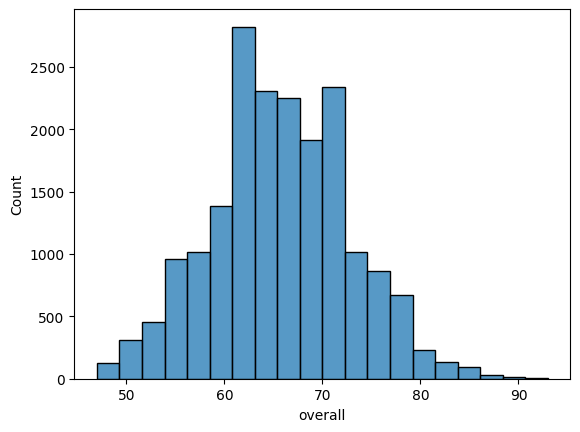

In [ ]:
sns.histplot (data=df3, x="overall", bins=20)

El gráfico muestra que la mayor cantidad de jugadores tiene un overall entre 60 y 72.

#### 4.5. Overall por Edad

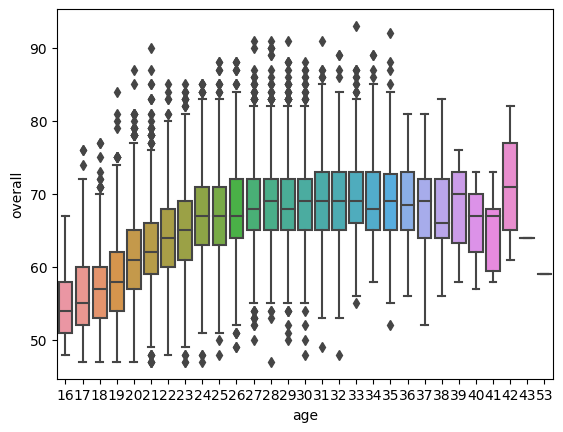

In [ ]:
ax = sns.boxplot(x="age", y="overall", data=df3)

El gráfico muestra que  el promedio más alto de overall se obtiene a los 42 años.

#### 4.6. Jugadores por Año de nacimiento y Sueldo



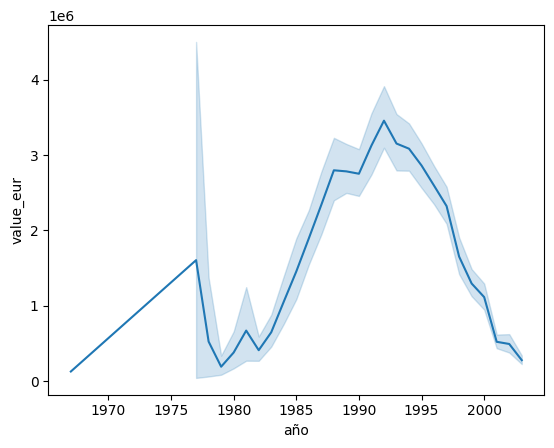

In [ ]:
df3['dob'] = pd.to_datetime(df3['dob'])
df3['año'] = df3['dob'].dt.year
ax = sns.lineplot(x="año", y="value_eur", data=df3)

El gráfico muestra que los jugadores mejor pagos nacieron entre los años 1990 y 1995.

##**5. Análisis de las estadísticas, sueldos y valores de mercado de los jugadores a través de Modelos de Regresión**

In [ ]:
#%matplotlib inline
#plt.style.use('ggplot')
from bokeh.resources import INLINE
import bokeh.io
from bokeh import *
import pingouin
bokeh.io.output_notebook(INLINE)

In [ ]:
df3.head()

,sofifa_id,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club_name,league_name,...,gk_positioning,attacking_finishing,skill_dribbling,movement_acceleration,movement_sprint_speed,power_shot_power,mentality_aggression,defending_standing_tackle,goalkeeping_handling,año
0,158023,L. Messi,Lionel AndrÃ©s Messi Cuccittini,33,1987-06-24,170,72,Argentina,FC Barcelona,Spain Primera Division,...,0,95,96,91,80,86,44,35,11,1987
1,20801,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,35,1985-02-05,187,83,Portugal,Juventus,Italian Serie A,...,0,95,88,87,91,94,63,32,11,1985
2,200389,J. Oblak,Jan Oblak,27,1993-01-07,188,87,Slovenia,AtlÃ©tico Madrid,Spain Primera Division,...,90,11,12,43,60,59,34,12,92,1993
3,188545,R. Lewandowski,Robert Lewandowski,31,1988-08-21,184,80,Poland,FC Bayern MÃ¼nchen,German 1. Bundesliga,...,0,94,85,77,78,89,81,42,6,1988
4,190871,Neymar Jr,Neymar da Silva Santos JÃºnior,28,1992-02-05,175,68,Brazil,Paris Saint-Germain,French Ligue 1,...,0,87,95,94,89,80,51,30,9,1992


In [ ]:
df3.columns

### **5.1. Valor de mercado en relación al sueldo**

In [ ]:
model1 = 'value_eur~wage_eur'
lm1   = sm.ols(formula = model1, data = df3).fit()
print(lm1.summary())

                            OLS Regression Results                            
Dep. Variable:              value_eur   R-squared:                       0.705
Model:                            OLS   Adj. R-squared:                  0.705
Method:                 Least Squares   F-statistic:                 4.478e+04
Date:                Wed, 04 Oct 2023   Prob (F-statistic):               0.00
Time:                        00:22:51   Log-Likelihood:            -3.0434e+05
No. Observations:               18719   AIC:                         6.087e+05
Df Residuals:                   18717   BIC:                         6.087e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   3.377e+05   2.23e+04     15.168      0.0

####Hallazgos
* Podemos inferir en que a mayor sueldo que tenga un jugador, probablemente tenga un mayor valor de mercado.
* Por cada euro más que cobre el jugador, su valor de mercado será 218 euros mayor.

### **5.2. Overall en relación a la edad**

In [ ]:
model2 = 'overall~age'
lm1   = sm.ols(formula = model2, data = df3).fit()
print(lm1.summary())

                            OLS Regression Results                            
Dep. Variable:                overall   R-squared:                       0.220
Model:                            OLS   Adj. R-squared:                  0.220
Method:                 Least Squares   F-statistic:                     5271.
Date:                Wed, 04 Oct 2023   Prob (F-statistic):               0.00
Time:                        00:25:18   Log-Likelihood:                -60674.
No. Observations:               18719   AIC:                         1.214e+05
Df Residuals:                   18717   BIC:                         1.214e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     47.9808      0.247    193.986      0.0

####Hallazgos
* Podemos inferir en que a mayor edad que tenga un jugador, probablemente tenga un mayor overall.
* Por cada año más que tenga el jugador, su overall será 0,7 veces mayor.
* El intervalo de confianza no es muy alto, por lo tanto el modelo no brinda datos confiables.

### **5.3. Overall en relación a sus skills en velocidad, disparo y pase**

In [ ]:
model3 = 'overall~pace + shooting + passing'
lm1   = sm.ols(formula = model3, data = df3).fit()
print(lm1.summary())


                            OLS Regression Results                            
Dep. Variable:                overall   R-squared:                       0.326
Model:                            OLS   Adj. R-squared:                  0.326
Method:                 Least Squares   F-statistic:                     3012.
Date:                Wed, 04 Oct 2023   Prob (F-statistic):               0.00
Time:                        00:37:45   Log-Likelihood:                -59309.
No. Observations:               18719   AIC:                         1.186e+05
Df Residuals:                   18715   BIC:                         1.187e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     54.8338      0.178    307.932      0.0

####Hallazgos
* Podemos inferir en que a mayor skills tenga un jugador en pase y disparo,  probablemente tenga un mayor overall.
* Por cada skill en pase tenga el jugador, su overall será 0,33 veces mayor.
* Por cada skill en disparo tenga el jugador, su overall será 0,05 veces mayor.
* Por cada skill en velocidad tenga el jugador, su overall será 0,16 veces menor.
* El intervalo de confianza no es muy alto, por lo tanto el modelo no brinda datos confiables.



### **5.4. Overall en relación al valor de mercado**

In [ ]:
model4 = 'value_eur~overall'
lm1   = sm.ols(formula = model4, data = df3).fit()
print(lm1.summary())


                            OLS Regression Results                            
Dep. Variable:              value_eur   R-squared:                       0.406
Model:                            OLS   Adj. R-squared:                  0.406
Method:                 Least Squares   F-statistic:                 1.279e+04
Date:                Sat, 09 Mar 2024   Prob (F-statistic):               0.00
Time:                        19:20:22   Log-Likelihood:            -3.1089e+05
No. Observations:               18719   AIC:                         6.218e+05
Df Residuals:                   18717   BIC:                         6.218e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -2.836e+07   2.72e+05   -104.203      0.0

####Hallazgos
* Podemos inferir en que a mayor overall tenga un jugador, probablemente tenga un mayor valor de mercado.
* Por cada punto de overall más tenga el jugador, su valor de mercado será USD 466.500 mayor.
* El intervalo de confianza no es muy alto, por lo tanto el modelo no brinda datos confiables.



##**6. Análisis de Mercado de Pases**

####**Filtros**

In [ ]:
df3_filter_defender = df3[df3['position_segment'] == 'Defender']
print(df3_filter_defender)

In [ ]:
df3_filter_midfielder = df3[df3['position_segment'] == 'Midfielder']
print(df3_filter_midfielder)

###6.1. Necesito incorporar un jugador nuevo a mi equipo para poder cumplir con los requisitos de la Champions League. ¿Qué posición es la más fácil de conseguir?

<Axes: xlabel='position_segment'>

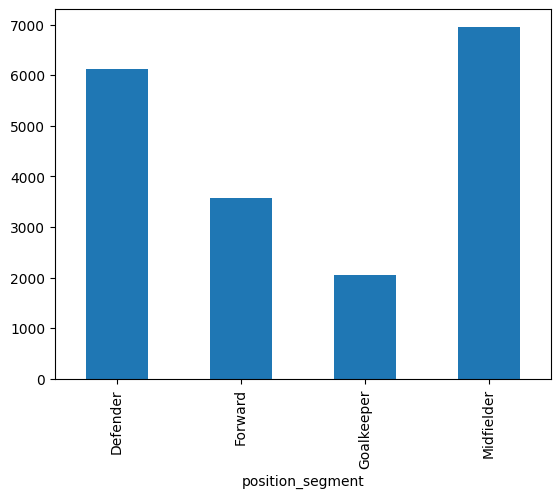

In [ ]:
position_segment_group = df3.groupby('position_segment').size()
position_segment_group.plot.bar()

In [ ]:
len(df3)

18719

In [ ]:
len(df3_filter_midfielder)

6950

###Respuesta:
La posición más facil de conseguir en el mercado es la de mediocampista, ya que de la totalidad de los jugadores en mercado, la posición de mediocampista es la que mayor oferta tiene. Los mediocampistas son 6950 y representan el 37% de los jugadores totales en mercado.


###6.2. Respondida la pregunta anterior. ¿Qué tipo de mediocampista es el más probable de conseguir?

<Axes: xlabel='player_positions2'>

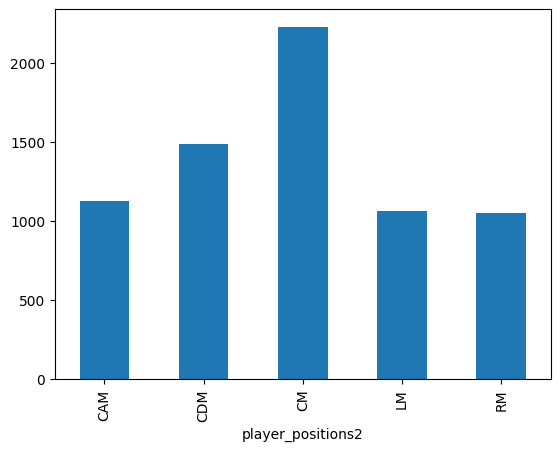

In [ ]:
player_positions2_group = df3_filter_midfielder.groupby('player_positions2').size()
player_positions2_group.plot.bar()

###Respuesta:
El tipo de mediocampista más fácil de conseguir es el Mediocampista Central (CM), ya que de la totalidad de los mediocampistas en mercado, el tipo Mediocampista Central es el que mayor oferta tiene. Los CM son 2226 y representan el 32% de los mediocampistas totales en mercado.


###6.3. ¿Qué tipo de mediocampista en promedio cuesta más barato?

<Axes: xlabel='player_positions2'>

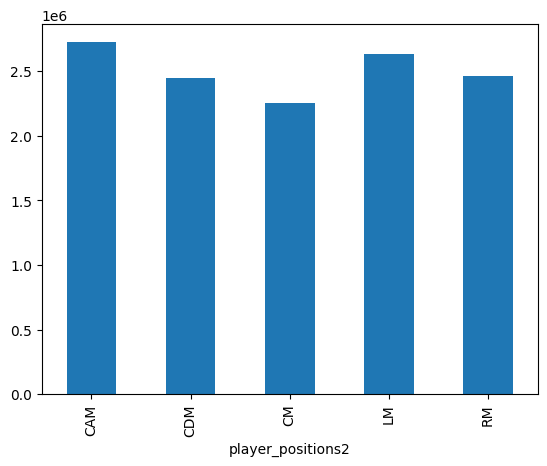

In [ ]:
player_positions2_value_group = df3_filter_midfielder.groupby('player_positions2')['value_eur'].mean()
player_positions2_value_group.plot.bar()

###Respuesta:
El tipo de mediocampista más barato en promedio es el Mediocampista Central (CM), ya que de la totalidad de los mediocampistas en mercado, el tipo Mediocampista Central es el más barato en promedio. Los CM tienen un valor promedio de $2.254.650, un 20% más barato que los Mediocampistas Atacantes(CAM).

###6.4. Insights Mercado de Pases

* Detectamos que si necesitamos un jugador de forma urgente, lo más rápido sería obtar por buscar un Mediocampista.
* En el caso de tener un presupuesto limitado, deberíamos obtar más específicamente por un Mediocampista Central, ya que en promedio su valor es el más bajos respecto de los diversos tipos de Mediocampistas.
* Además, el Mediocampista Central es el tipo de mediocampista que más hay en el mercado, siendo la mejor opción.



In [ ]:
#Para realizar el feature engineering incorporamos 3 columnas más (potential, preferred_foot, position_segment)
#que las utilizadas en las pruebas anteriores

df3_feature = df3[['age',
 'height_cm',
 'overall',
 'potential',
 'wage_eur',
 'skill_moves',
 'pace',
 'shooting',
 'passing',
 'dribbling',
 'power_shot_power',
 'mentality_aggression', 'value_eur', 'preferred_foot', 'position_segment']]


In [ ]:
df3_feature = df3_feature.copy()

In [ ]:
# Crear una nueva característica que indique el sueldo anual
df3_feature['annual_wage_eur'] = df3_feature['wage_eur'] * 12
# Codificar la característica 'estado_civil' utilizando one-hot encoding
df3_feature = pd.get_dummies(df3_feature, columns=['position_segment'])
df3_feature = pd.get_dummies(df3_feature, columns=['preferred_foot'])

In [ ]:
df3_feature.columns

Index(['age', 'height_cm', 'overall', 'potential', 'wage_eur', 'skill_moves',
       'pace', 'shooting', 'passing', 'dribbling', 'power_shot_power',
       'mentality_aggression', 'value_eur', 'annual_wage_eur',
       'position_segment_Defender', 'position_segment_Forward',
       'position_segment_Goalkeeper', 'position_segment_Midfielder',
       'preferred_foot_Left', 'preferred_foot_Right'],
      dtype='object')

## **7. Backward selection**

In [ ]:
columnas_x = ['age','height_cm','weight_kg','overall', 'potential', 'wage_eur','skill_moves','pace', 'shooting', 'passing', 'dribbling','defending', 'physic','attacking_finishing','skill_dribbling', 'movement_acceleration','movement_sprint_speed','power_shot_power', 'mentality_aggression', 'defending_standing_tackle']   #CAMBIAR

In [ ]:
X = df3[columnas_x]       # feature matrix
y = df3['value_eur']               # target feature

In [ ]:
def backward_elimination(data, target,significance_level = 0.05):
    features = data.columns.tolist()
    while(len(features)>0):
        features_with_constant = sm.add_constant(data[features])
        p_values = sm.OLS(target, features_with_constant).fit().pvalues[1:]
        max_p_value = p_values.max()
        if(max_p_value >= significance_level):
            excluded_feature = p_values.idxmax()
            features.remove(excluded_feature)
        else:
            break
    return features

In [ ]:
backward_elimination(X,y)

['age',
 'height_cm',
 'overall',
 'wage_eur',
 'skill_moves',
 'pace',
 'shooting',
 'passing',
 'dribbling',
 'power_shot_power',
 'mentality_aggression']

In [ ]:
df3_reducido = df3[['age',
 'height_cm',
 'overall',
 'wage_eur',
 'skill_moves',
 'pace',
 'shooting',
 'passing',
 'dribbling',
 'power_shot_power',
 'mentality_aggression', 'value_eur']]

In [ ]:
print(df3_reducido)

In [ ]:
columnas_x_red = ['age',
 'height_cm',
 'overall',
 'wage_eur',
 'skill_moves',
 'pace',
 'shooting',
 'passing',
 'dribbling',
 'power_shot_power',
 'mentality_aggression']

In [ ]:
X_red = df3[columnas_x_red]

In [ ]:
Promedio_Sueldo = df3['value_eur'].mean()
print(Promedio_Sueldo)

2251938.2979860036


##**8. Métrica algoritmos de regresión**

In [ ]:
from sklearn import datasets, linear_model
from sklearn.metrics import mean_squared_error, r2_score

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X_red,y,test_size=0.2,random_state=2)
from sklearn.linear_model import LinearRegression
# crear el modelo
lr = LinearRegression()
# Ajustar el modelo con X_train y y_train
lr.fit(X_train,y_train)
# PRedecir con X_test
y_pred = lr.predict(X_test)

####MAE

In [ ]:
from sklearn.metrics import mean_absolute_error
print("MAE",mean_absolute_error(y_test,y_pred))

MAE 1300307.2595399946


####MSE

In [ ]:
from sklearn.metrics import mean_squared_error
print("MSE",mean_squared_error(y_test,y_pred))

MSE 6539851203317.554


####RMSE

In [ ]:
print("RMSE",np.sqrt(mean_squared_error(y_test,y_pred)))

RMSE 2557313.2782898447


####RMSE - Logaritmo natural

In [ ]:
print("RMSE",np.log(np.sqrt(mean_squared_error(y_test,y_pred))))

RMSE 14.754467764676262


####r2

In [ ]:
from sklearn.metrics import r2_score
r2 = r2_score(y_test,y_pred)
print(r2)

0.7758591438042517


### **6.1. Conclusiones**

En base a los resultados obtenidos, particularmente por el r2 de 0,776, considero que el modelo tiene una buena predicción, para poder determinar el sueldo que se le debe pagar a los jugadores en base a su valor de mercado y sus principales cualidades.

## **9. Evualuación Modelos ML**

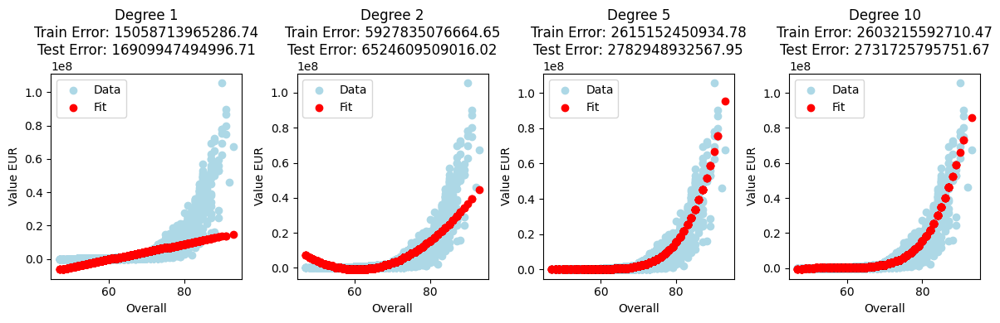

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error

# Separar los datos en características (X) y variable objetivo (y)
X_ev = df3['overall'].values.reshape(-1, 1)  # Característica (variable independiente)
y_ev = df3['value_eur'].values  # Variable objetivo (variable dependiente)

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_ev, y_ev, test_size=0.3, random_state=42)

# Crear listas para almacenar los errores de entrenamiento y prueba
train_errors, test_errors = [], []

# Probar diferentes grados de polinomio para la regresión
degrees = [1, 2, 5, 10]

plt.figure(figsize=(12, 4))

for i, degree in enumerate(degrees, 1):
    # Crear características polinomiales
    poly = PolynomialFeatures(degree=degree)
    X_poly_train = poly.fit_transform(X_train)
    X_poly_test = poly.transform(X_test)

    # Crear y entrenar el modelo de regresión lineal
    model = LinearRegression()
    model.fit(X_poly_train, y_train)

    # Realizar predicciones en conjuntos de entrenamiento y prueba
    y_pred_train = model.predict(X_poly_train)
    y_pred_test = model.predict(X_poly_test)

    # Calcular el error cuadrático medio para entrenamiento y prueba
    train_error = mean_squared_error(y_train, y_pred_train)
    test_error = mean_squared_error(y_test, y_pred_test)

    train_errors.append(train_error)
    test_errors.append(test_error)

    # Visualizar los ajustes del modelo
    plt.subplot(1, len(degrees), i)
    plt.scatter(X_ev, y_ev, color='lightblue', label='Data')
    plt.scatter(X_test, y_pred_test, color='red', label='Fit')
    plt.title(f'Degree {degree}\nTrain Error: {train_error:.2f}\nTest Error: {test_error:.2f}')
    plt.xlabel('Overall')
    plt.ylabel('Value EUR')
    plt.legend()

plt.tight_layout()
plt.show()


### **9.1. Conclusiones**

Podemos visualizar en el Grado 1 un claro Underfitting, mientras que en el Grado 10 un modelo más balanceado.

## **10. Insights utilizando Pandas Profiling**

In [ ]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

In [ ]:
df3_reducido.shape

(18719, 12)

In [ ]:
df3_reducido.count()

age                     18719
height_cm               18719
overall                 18719
wage_eur                18719
skill_moves             18719
pace                    18719
shooting                18719
passing                 18719
dribbling               18719
power_shot_power        18719
mentality_aggression    18719
value_eur               18719
dtype: int64

In [ ]:
df3_reducido.describe().T

,count,mean,std,min,25%,50%,75%,max
age,18719.0,2.517779e+01,4.682187e+00,16.0,21.0,25.0,28.0,53.0
height_cm,18719.0,1.811901e+02,6.819258e+00,155.0,176.0,181.0,186.0,206.0
overall,18719.0,6.563502e+01,7.003908e+00,47.0,61.0,66.0,70.0,93.0
wage_eur,18719.0,8.780135e+03,1.974938e+04,500.0,1000.0,3000.0,8000.0,560000.0
skill_moves,18719.0,2.362680e+00,7.658559e-01,1.0,2.0,2.0,3.0,5.0
pace,18719.0,6.298189e+01,1.688927e+01,25.0,57.0,67.0,74.0,96.0
shooting,18719.0,4.925354e+01,1.571139e+01,16.0,35.0,52.0,62.0,93.0
passing,18719.0,5.357594e+01,1.395608e+01,25.0,47.0,56.0,63.0,93.0
dribbling,18719.0,5.832801e+01,1.505708e+01,25.0,53.0,62.0,68.0,95.0
power_shot_power,18719.0,5.772328e+01,1.333131e+01,18.0,48.0,59.0,68.0,95.0


In [ ]:
import pandas_profiling

<ipython-input-44-6a00893fb3e1>:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling


In [ ]:
#Data Profiling
profile = pandas_profiling.ProfileReport(df3_reducido)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## **11. Correlación**

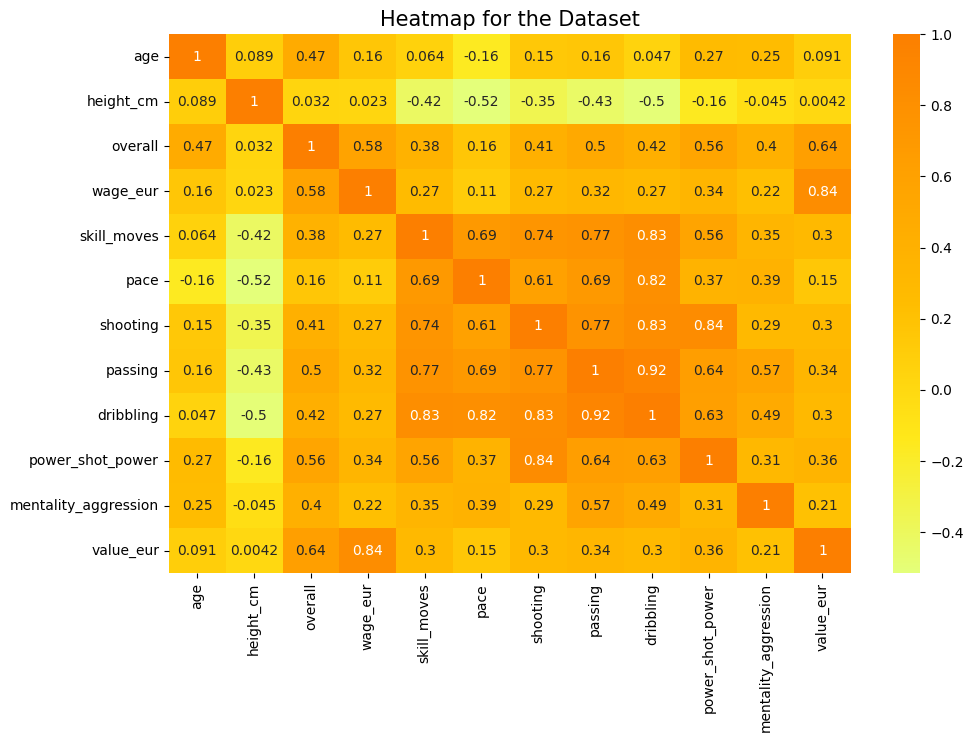

In [ ]:
#Hagamos un HeatMap del df
plt.rcParams['figure.figsize'] = (11, 7)

sns.heatmap(df3_reducido.corr(), annot = True, cmap = 'Wistia')
plt.title('Heatmap for the Dataset', fontsize = 15)
plt.show()

In [ ]:
df3_reducido_2 = df3 [['age','height_cm','weight_kg','overall', 'potential', 'value_eur', 'wage_eur','skill_moves','pace', 'shooting', 'passing', 'dribbling','defending', 'physic','attacking_finishing','skill_dribbling', 'movement_acceleration','movement_sprint_speed','power_shot_power', 'mentality_aggression', 'defending_standing_tackle']]

In [ ]:
df3_reducido_3 = df3 [['age','height_cm','weight_kg','overall', 'potential', 'value_eur', 'wage_eur','skill_moves','pace', 'shooting', 'passing', 'dribbling','defending', 'physic','attacking_finishing','skill_dribbling', 'movement_acceleration','movement_sprint_speed','power_shot_power', 'mentality_aggression']]

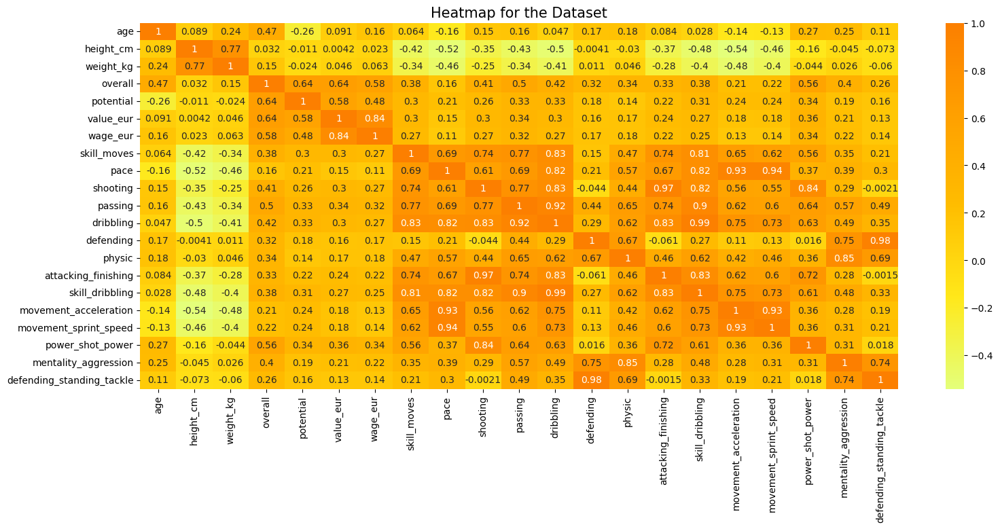

In [ ]:
#Hagamos un HeatMap del df
plt.rcParams['figure.figsize'] = (18, 7)

sns.heatmap(df3_reducido_2.corr(), annot = True, cmap = 'Wistia')
plt.title('Heatmap for the Dataset', fontsize = 15)
plt.show()

In [ ]:
df3_correlación = df3_reducido_3.corr()

In [ ]:
df3_correlación

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,skill_moves,pace,shooting,passing,dribbling,defending,physic,attacking_finishing,skill_dribbling,movement_acceleration,movement_sprint_speed,power_shot_power,mentality_aggression
age,1.000000,0.089319,0.240576,0.468749,-0.262806,0.090628,0.163486,0.064064,-0.163808,0.145921,0.162474,0.047354,0.171918,0.181975,0.083740,0.028201,-0.136867,-0.130651,0.269025,0.248945
height_cm,0.089319,1.000000,0.772011,0.031799,-0.011047,0.004174,0.022583,-0.418792,-0.515690,-0.346305,-0.434876,-0.500958,-0.004100,-0.029891,-0.371490,-0.477675,-0.541401,-0.458325,-0.158333,-0.045204
weight_kg,0.240576,0.772011,1.000000,0.146086,-0.024357,0.045684,0.062599,-0.344599,-0.462019,-0.245463,-0.343062,-0.412328,0.010688,0.046209,-0.284498,-0.396798,-0.478262,-0.403348,-0.044422,0.026135
overall,0.468749,0.031799,0.146086,1.000000,0.635696,0.637207,0.580928,0.382138,0.160104,0.412971,0.501341,0.420215,0.321351,0.340993,0.326450,0.379796,0.206963,0.215842,0.559618,0.402826
potential,-0.262806,-0.011047,-0.024357,0.635696,1.000000,0.575574,0.477673,0.297191,0.207446,0.260804,0.332851,0.333499,0.175045,0.143032,0.217369,0.308702,0.239748,0.240506,0.336559,0.190485
value_eur,0.090628,0.004174,0.045684,0.637207,0.575574,1.000000,0.839782,0.296301,0.149781,0.295132,0.336222,0.299530,0.163345,0.174134,0.244317,0.271592,0.179188,0.183358,0.357689,0.207852
wage_eur,0.163486,0.022583,0.062599,0.580928,0.477673,0.839782,1.000000,0.268163,0.112044,0.271976,0.316613,0.273667,0.174363,0.175073,0.220501,0.248110,0.133163,0.136365,0.337381,0.219056
skill_moves,0.064064,-0.418792,-0.344599,0.382138,0.297191,0.296301,0.268163,1.000000,0.693091,0.739536,0.770966,0.826023,0.151302,0.473338,0.739533,0.811698,0.648018,0.616804,0.564301,0.354008
pace,-0.163808,-0.515690,-0.462019,0.160104,0.207446,0.149781,0.112044,0.693091,1.000000,0.608372,0.692685,0.821832,0.214392,0.566652,0.665367,0.818836,0.934194,0.941782,0.368403,0.389404
shooting,0.145921,-0.346305,-0.245463,0.412971,0.260804,0.295132,0.271976,0.739536,0.608372,1.000000,0.772262,0.828593,-0.044328,0.444872,0.969239,0.818659,0.563979,0.548164,0.842886,0.293120


## **12. KFOLD Cross Validation Regresion**

In [ ]:
import pandas as pd
import numpy as np
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn import metrics

#cross validation libs
from sklearn.model_selection import KFold, cross_val_score

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold, cross_val_score

# Instanciar el metodo con los kfold desados
kfold = KFold(3)

# Instanciar el modelo a entrenar
model = RandomForestRegressor()


# dividimos el conjunto de datos
# obtenemos los indices de cada splits
splits = kfold.split(X)





In [ ]:
# Realizamos el for para iterar sobre los splits
# Recuerda que cada split tiene los indices de entrenamiento y test
scores = []

# utilizamos el metodo enumerate que retorna el indice
# del split y una tupla con (train, test) indices
for i, (train_index,test_index) in enumerate(splits) :

  if i == 0:
    print (f"Indices Train {train_index[0:5]} tamaño {len(train_index)}")
    print (f"Indices Test  {test_index [0:5]} tamaño {len(test_index)}")

  #Entrenamos con los indices de train
  model.fit(X.iloc[train_index], y.iloc[train_index])

  #Estimamos con el indice de prueba
  y_pred = model.predict(X.iloc[test_index])

  #Obtenemos score con el indice de prueba
  score = mean_absolute_error(y.iloc[test_index], y_pred)

  #agregamos resultado al scores general
  scores.append(score)

Indices Train [0 1 2 3 4] tamaño 12479
Indices Test  [6240 6241 6242 6243 6244] tamaño 6240


## **13. Featuring Engineering**

In [ ]:
#Para realizar el feature engineering incorporamos 3 columnas más (potential, preferred_foot, position_segment)
#que las utilizadas en las pruebas anteriores

df3_feature = df3[['age',
 'height_cm',
 'overall',
 'potential',
 'wage_eur',
 'skill_moves',
 'pace',
 'shooting',
 'passing',
 'dribbling',
 'power_shot_power',
 'mentality_aggression', 'value_eur', 'preferred_foot', 'position_segment']]


In [ ]:
df3_feature = df3_feature.copy()

In [ ]:
# Crear una nueva característica que indique el sueldo anual
df3_feature['annual_wage_eur'] = df3_feature['wage_eur'] * 12
# Codificar la característica 'estado_civil' utilizando one-hot encoding
df3_feature = pd.get_dummies(df3_feature, columns=['position_segment'])
df3_feature = pd.get_dummies(df3_feature, columns=['preferred_foot'])

In [ ]:
df3_feature.columns

Index(['age', 'height_cm', 'overall', 'potential', 'wage_eur', 'skill_moves',
       'pace', 'shooting', 'passing', 'dribbling', 'power_shot_power',
       'mentality_aggression', 'value_eur', 'annual_wage_eur',
       'position_segment_Defender', 'position_segment_Forward',
       'position_segment_Goalkeeper', 'position_segment_Midfielder',
       'preferred_foot_Left', 'preferred_foot_Right'],
      dtype='object')

In [ ]:
print ("Ejemplo Score ", scores[0:5])
print (f"Media de los resultados {np.mean(scores)}")

Ejemplo Score  [200223.7580128205, 224910.58663247316]
Media de los resultados 212567.17232264683


## **14. Prueba outliers con Isolation Forest**

In [ ]:
df3_feature_2 = df3[['age',
 'height_cm',
 'overall',
 'potential',
 'value_eur',
 'dribbling',
 'defending',
 'physic',
 'movement_acceleration',
 'mentality_aggression','wage_eur']]

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


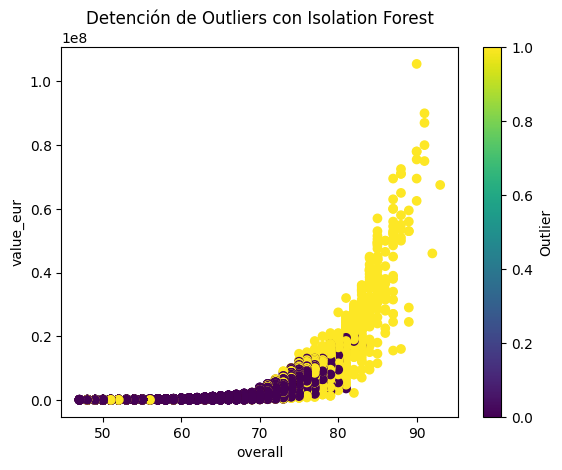

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import IsolationForest


# Entrenar el modelo Isolation Forest
model = IsolationForest(contamination=0.1)  # contamination representa la proporción esperada de valores atípicos
model.fit(df3_feature)

# Predecir outliers
outliers = model.predict(df3_feature)
outliers_mask = outliers == -1  # Filtrar los valores que son considerados outliers

# Visualizar los outliers
plt.scatter(df3_feature['overall'], df3_feature['value_eur'], c=outliers_mask, cmap='viridis')
plt.xlabel('overall')
plt.ylabel('value_eur')
plt.title('Detención de Outliers con Isolation Forest')
plt.colorbar(label='Outlier')
plt.show()


In [ ]:
print(outliers)

[-1 -1 -1 ...  1  1  1]


In [ ]:
print(outliers_mask)

[ True  True  True ... False False False]


In [ ]:
df_clean = df3_feature[~outliers_mask]

In [ ]:
print(df_clean)

       age  height_cm  overall  potential  wage_eur  skill_moves  pace  \
183     32        183       83         83     39000            3    66   
255     29        187       82         82       500            3    82   
260     28        188       82         82     20000            3    66   
317     37        188       81         81     13000            2    66   
339     29        196       81         81     19000            2    59   
...    ...        ...      ...        ...       ...          ...   ...   
18714   24        176       47         52       500            2    63   
18715   21        177       47         52      1000            2    58   
18716   20        185       47         51      1000            2    51   
18717   23        186       47         51      1000            2    61   
18718   28        185       47         47      2000            2    65   

       shooting  passing  dribbling  power_shot_power  mentality_aggression  \
183          62       74        

In [ ]:
model5 = 'value_eur~potential+overall'
lm1   = sm.ols(formula = model5, data = df_clean).fit()
print(lm1.summary())

                            OLS Regression Results                            
Dep. Variable:              value_eur   R-squared:                       0.550
Model:                            OLS   Adj. R-squared:                  0.550
Method:                 Least Squares   F-statistic:                 1.028e+04
Date:                Sun, 10 Mar 2024   Prob (F-statistic):               0.00
Time:                        20:09:01   Log-Likelihood:            -2.6103e+05
No. Observations:               16847   AIC:                         5.221e+05
Df Residuals:                   16844   BIC:                         5.221e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -1.713e+07   1.37e+05   -124.665      0.0

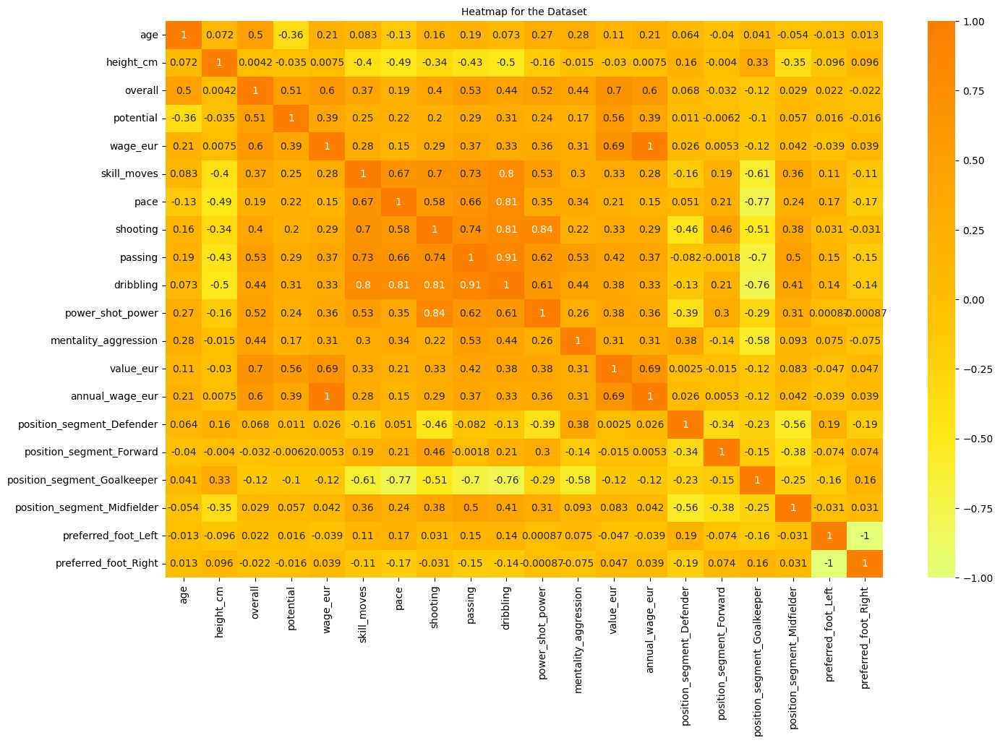

In [ ]:
#Hagamos un HeatMap del df
plt.rcParams['figure.figsize'] = (16, 10)

sns.heatmap(df_clean.corr(), annot = True, cmap = 'Wistia')
plt.title('Heatmap for the Dataset', fontsize = 10)
plt.show()

## **15. Prueba outliers con DBSCAN**

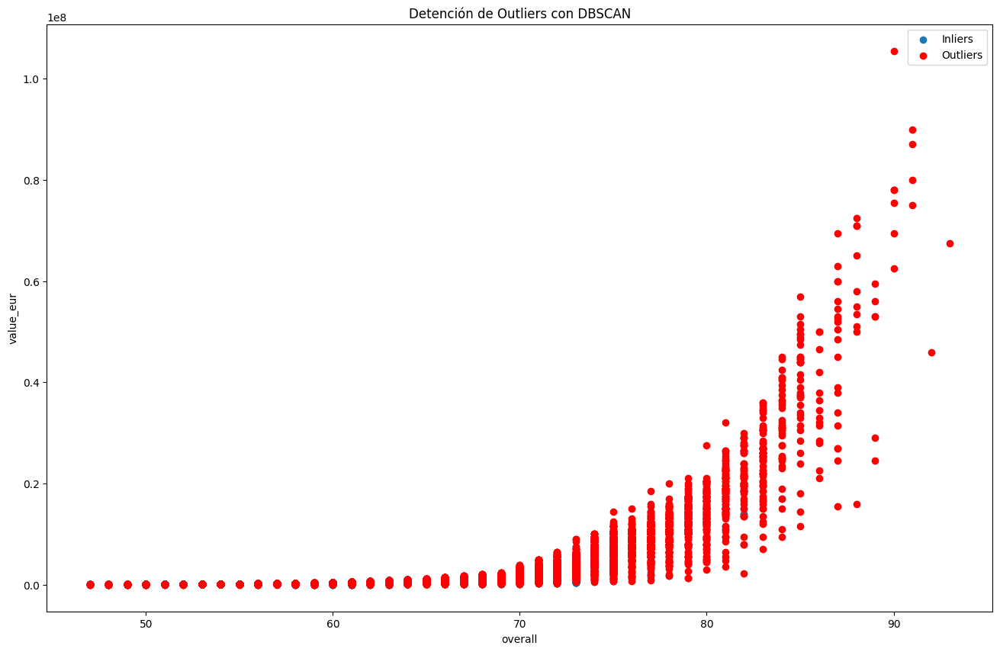

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

# Escalar los datos para que tengan media cero y desviación estándar uno
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df3_feature)

# Entrenar el modelo DBSCAN
model = DBSCAN(eps=0.9, min_samples=2)  # eps es la distancia máxima entre dos muestras para ser consideradas vecinas
model.fit(df_scaled)

# Filtrar los outliers
outliers_mask = model.labels_ == -1

# Eliminar los outliers del DataFrame
df_clean_2 = df3_feature[~outliers_mask]

# Visualizar los resultados
plt.scatter(df_clean_2['overall'], df_clean_2['value_eur'], label='Inliers')
plt.scatter(df3_feature[outliers_mask]['overall'], df3_feature[outliers_mask]['value_eur'], color='red', label='Outliers')
plt.xlabel('overall')
plt.ylabel('value_eur')
plt.title('Detención de Outliers con DBSCAN')
plt.legend()
plt.show()

In [ ]:
print(df_clean_2)

       age  height_cm  overall  potential  wage_eur  skill_moves  pace  \
123     33        192       84         84     54000            1    25   
188     29        189       83         83     35000            1    25   
209     31        190       83         83     47000            1    25   
225     28        189       82         85     35000            1    25   
228     27        188       82         84     20000            1    25   
...    ...        ...      ...        ...       ...          ...   ...   
18711   23        170       47         55      1000            2    63   
18712   20        181       47         53      1000            2    59   
18713   21        174       47         53      1000            2    58   
18714   24        176       47         52       500            2    63   
18715   21        177       47         52      1000            2    58   

       shooting  passing  dribbling  power_shot_power  mentality_aggression  \
123          25       25        

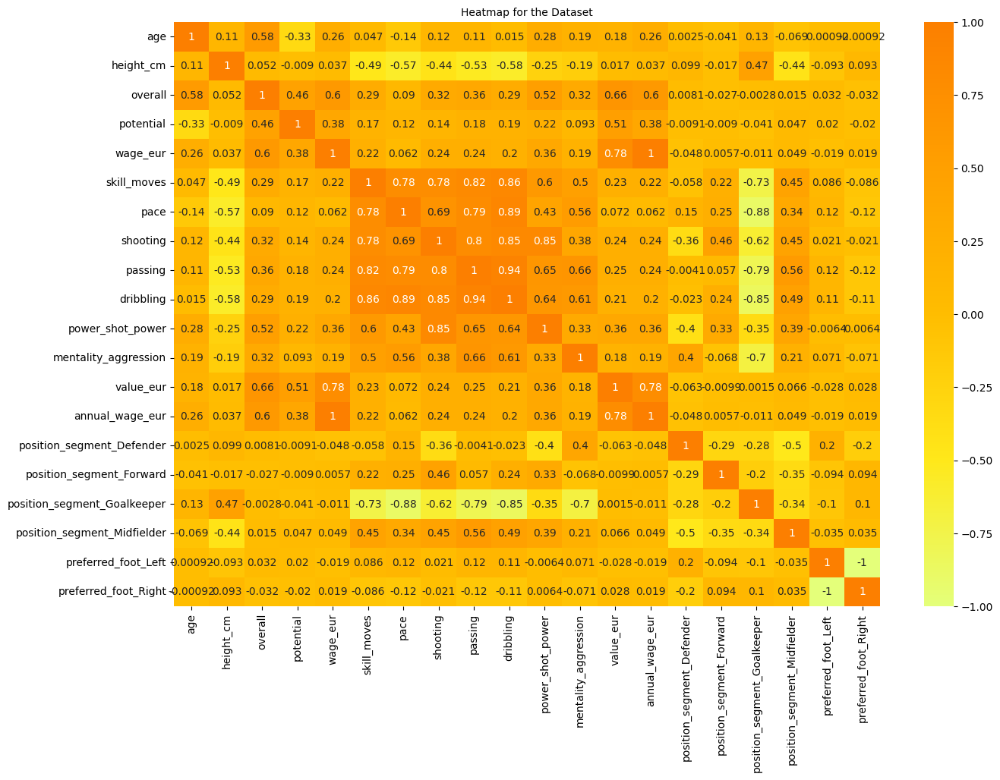

In [ ]:
#Hagamos un HeatMap del df
plt.rcParams['figure.figsize'] = (15, 10)

sns.heatmap(df_clean_2.corr(), annot = True, cmap = 'Wistia')
plt.title('Heatmap for the Dataset', fontsize = 10)
plt.show()

In [ ]:
model6 = 'value_eur~potential+overall'
lm1   = sm.ols(formula = model6, data = df_clean_2).fit()
print(lm1.summary())

                            OLS Regression Results                            
Dep. Variable:              value_eur   R-squared:                       0.486
Model:                            OLS   Adj. R-squared:                  0.486
Method:                 Least Squares   F-statistic:                     5466.
Date:                Sun, 10 Mar 2024   Prob (F-statistic):               0.00
Time:                        20:09:10   Log-Likelihood:            -1.7855e+05
No. Observations:               11574   AIC:                         3.571e+05
Df Residuals:                   11571   BIC:                         3.571e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -1.489e+07   1.67e+05    -89.321      0.0

## **16. KFOLD Cross Validation Regresion Parte 2**

In [ ]:
import pandas as pd
import numpy as np
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn import metrics

#cross validation libs
from sklearn.model_selection import KFold, cross_val_score

In [ ]:
X2 = df_clean.drop('value_eur', axis=1)

In [ ]:
y2 = df_clean['value_eur']

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold, cross_val_score

# Instanciar el metodo con los kfold desados
kfold = KFold(3)

# Instanciar el modelo a entrenar
model = RandomForestRegressor()


# dividimos el conjunto de datos
# obtenemos los indices de cada splits
splits = kfold.split(X2)





In [ ]:
# Realizamos el for para iterar sobre los splits
# Recuerda que cada split tiene los indices de entrenamiento y test
scores = []

# utilizamos el metodo enumerate que retorna el indice
# del split y una tupla con (train, test) indices
for i, (train_index,test_index) in enumerate(splits) :

  if i == 0:
    print (f"Indices Train {train_index[0:5]} tamaño {len(train_index)}")
    print (f"Indices Test  {test_index [0:5]} tamaño {len(test_index)}")

  #Entrenamos con los indices de train
  model.fit(X2.iloc[train_index], y2.iloc[train_index]) #Completar

  #Estimamos con el indice de prueba
  y_pred2 = model.predict(X2.iloc[test_index]) #Completar

  #Obtenemos score con el indice de prueba
  score = metrics.mean_absolute_error(y2.iloc[test_index], y_pred2) # Completar para obetener la metrica de este conjunto
  #Siguiendo la convencion de sklearn algunos metricas pueden ser negativas
  #obtenemos el valor absoluto
  abs (score)

  #agregamos resultado al scores general
  scores.append(score)

Indices Train [5616 5617 5618 5619 5620] tamaño 11231
Indices Test  [0 1 2 3 4] tamaño 5616


In [ ]:
print ("Ejemplo Score ", scores[0:5])
print (f"Media de los resultados {np.mean(scores)}")

Ejemplo Score  [2018525.1157407407, 174477.41274928776, 205992.11932324132]
Media de los resultados 799664.8826044233


## **17. Prueba Modelos Machine Learning**

### 17.1. Adaboost

In [ ]:
pip install -q missingno

In [ ]:
pip install xgboost

In [ ]:
pip install lightgbm

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import missingno as msno

from sklearn.ensemble import AdaBoostRegressor
from sklearn.model_selection import train_test_split
from sklearn import metrics

from sklearn.ensemble import GradientBoostingRegressor

from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import median_absolute_error

import xgboost as xgb

import lightgbm as lgb

In [ ]:
#Separación en Train y VALIDACION
X_train, X_test, y_train, y_test = train_test_split(X2, y2, test_size=0.20)

In [ ]:
ada = AdaBoostRegressor(n_estimators=12,learning_rate=0.1, loss='linear',random_state=42)

In [ ]:
#Fiteamos el modelo
model = ada.fit(X_train, y_train)

In [ ]:
#Predicción!
y_pred = model.predict(X_test) # Sacar predicciones con test

In [ ]:
r2=r2_score(y_true=y_test, y_pred=y_pred)
print('coeficiente de determinacion, r2: ', r2) #que tan bien explica modelo, entre mas cerca a 1 mejor

mse=mean_squared_error(y_true=y_test, y_pred=y_pred)
print('MSE: ',mse) #esta en unidades cuadradas, entre mas cerca a 0 es mejor

mae=median_absolute_error(y_true=y_test, y_pred=y_pred)
print('MedianAE: ',mae) #en terminos de mediana, cuanto se alejan predicciones de valor real

coeficiente de determinacion, r2:  0.9158507244018993
MSE:  347812244967.6646
MedianAE:  190220.20927690144


In [ ]:
df_clean.median()

age                                24.0
height_cm                         181.0
overall                            65.0
potential                          70.0
wage_eur                         2000.0
skill_moves                         2.0
pace                               67.0
shooting                           51.0
passing                            56.0
dribbling                          62.0
power_shot_power                   58.0
mentality_aggression               58.0
value_eur                      575000.0
annual_wage_eur                 24000.0
position_segment_Defender           0.0
position_segment_Forward            0.0
position_segment_Goalkeeper         0.0
position_segment_Midfielder         0.0
preferred_foot_Left                 0.0
preferred_foot_Right                1.0
dtype: float64

### 17.2. GradientBoosting

In [ ]:
#Ahora comparemos con GBM
gbrt=GradientBoostingRegressor(random_state=42)

In [ ]:
#Fiteamos el modelo
model1 = gbrt.fit(X_train, y_train)

In [ ]:
y_pred = model1.predict(X_test)

In [ ]:
r2=r2_score(y_true=y_test, y_pred=y_pred)
print('r2: ', r2)

mse=mean_squared_error(y_true=y_test, y_pred=y_pred)
print('MSE: ',mse)

mae=median_absolute_error(y_true=y_test, y_pred=y_pred)
print('MedianAE: ',mae)

r2:  0.9931730764367754
MSE:  28217564487.285645
MedianAE:  28391.103961134824


### 17.3. LightGBM

In [ ]:
clf = lgb.LGBMRegressor(learning_rate=0.01,n_estimators=100)
clf.fit(X_train, y_train)
y_pred=clf.predict(X_test)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001450 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 707
[LightGBM] [Info] Number of data points in the train set: 13477, number of used features: 19
[LightGBM] [Info] Start training from score 1271330.043778


In [ ]:
r2=r2_score(y_true=y_test, y_pred=y_pred)
print('r2: ', r2)
mse=mean_squared_error(y_true=y_test, y_pred=y_pred)
print('MSE: ',mse)
mae=median_absolute_error(y_true=y_test, y_pred=y_pred)
print('MedianAE: ',mae)

r2:  0.8327534600197166
MSE:  691276236428.2264
MedianAE:  333618.6491761082


### 17.4. XGBoost

In [ ]:
regressor = xgb.XGBRegressor(
    n_estimators=100,
    max_depth=3
)

In [ ]:
#Fiteamos
regressor.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [ ]:
#Predecimos
y_pred = regressor.predict(X_test)

In [ ]:
r2=r2_score(y_true=y_test, y_pred=y_pred)
print('r2: ', r2)
mse=mean_squared_error(y_true=y_test, y_pred=y_pred)
print('MSE: ',mse)
mae=median_absolute_error(y_true=y_test, y_pred=y_pred)
print('MedianAE: ',mae)

r2:  0.9941064441940379
MSE:  24359697230.241436
MedianAE:  33693.6875


### 17.5. Comparativa Modelos Machine Learning

In [ ]:
y2 = y2.values.reshape(-1, 1)

In [ ]:
df_clean['Id'] = X2.index
df_clean['Prediccion_Adaboost'] = model.predict(X2)
df_clean['Prediccion_GradientBoosting'] = gbrt.predict(X2)
df_clean['Prediccion_LightGBM'] = clf.predict(X2)
df_clean['Prediccion_XGBoost'] = regressor.predict(X2)

In [ ]:
df_clean.head()

,age,height_cm,overall,potential,wage_eur,skill_moves,pace,shooting,passing,dribbling,...,position_segment_Forward,position_segment_Goalkeeper,position_segment_Midfielder,preferred_foot_Left,preferred_foot_Right,Id,Prediccion_Adaboost,Prediccion_GradientBoosting,Prediccion_LightGBM,Prediccion_XGBoost
183,32,183,83,83,39000,3,66,62,74,73,...,0,0,1,0,1,183,1.110242e+07,1.647217e+07,6.570924e+06,15786326.0
255,29,187,82,82,500,3,82,61,74,79,...,0,0,0,0,1,255,1.110242e+07,1.824845e+07,9.114819e+06,18326358.0
260,28,188,82,82,20000,3,66,63,72,73,...,0,0,1,0,1,260,1.110242e+07,1.941062e+07,9.114819e+06,19757698.0
317,37,188,81,81,13000,2,66,51,60,60,...,0,0,0,0,1,317,8.820625e+06,3.899876e+06,5.137978e+06,3521880.0
339,29,196,81,81,19000,2,59,43,54,61,...,0,0,0,0,1,339,8.820625e+06,1.203745e+07,8.042787e+06,11954370.0


In [ ]:
df_comp = df_clean [['Id', 'overall', 'value_eur', 'Prediccion_Adaboost', 'Prediccion_GradientBoosting', 'Prediccion_LightGBM', 'Prediccion_XGBoost']]

In [ ]:
df_comp = df_comp.astype(int)

In [ ]:
df_comp.head(20)

,Id,overall,value_eur,Prediccion_Adaboost,Prediccion_GradientBoosting,Prediccion_LightGBM,Prediccion_XGBoost
183,183,83,17000000,11102419,16472173,6570923,15786326
255,255,82,18500000,11102419,18248451,9114818,18326358
260,260,82,20000000,11102419,19410617,9114818,19757698
317,317,81,3600000,8820625,3899876,5137978,3521880
339,339,81,15000000,8820625,12037451,8042786,11954370
362,362,81,19500000,8820625,14110211,8606974,14773218
389,389,80,18000000,10586475,16444808,9114818,16450350
408,408,80,16500000,10586475,15950439,9114818,16011580
436,436,80,4500000,8820625,4723999,5137978,4640478
456,456,80,14000000,8820625,13416204,8320312,13511436


### 17.6. Conclusión

#### El modelo con mejor performance es el Gradient Boosting.

#### Gráficamos los resultados de predicción del Gradient Boosting:

In [ ]:
X3 = df_comp['overall']
y3 = df_comp['value_eur']
y_pred3 = df_comp['Prediccion_GradientBoosting']


In [ ]:
X3_unique = np.unique(X3)
y_pred_mean = [np.mean(y_pred3[X3 == x]) for x in X3_unique]

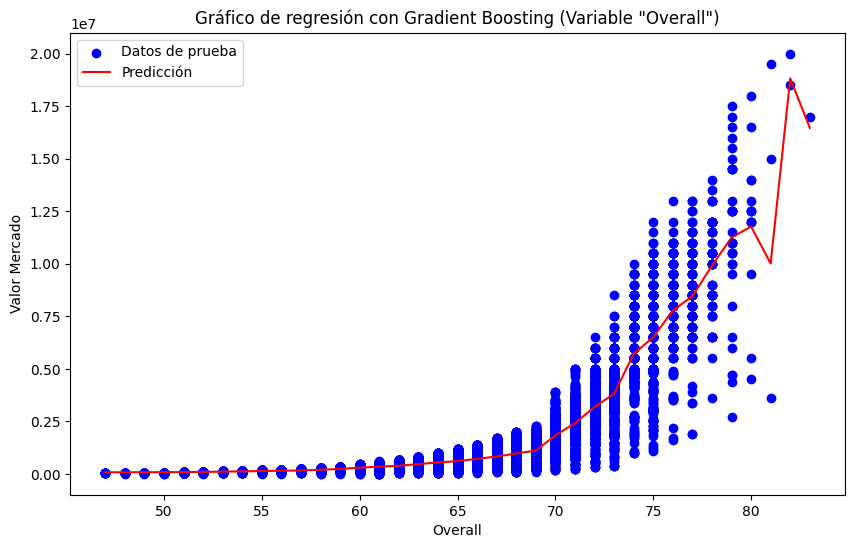

In [ ]:
# Graficamos los resultados
plt.figure(figsize=(10, 6))
plt.scatter(X3, y3, color='blue', label='Datos Dataset')
plt.plot(X3_unique, y_pred_mean, color='red', label='Predicción')
plt.xlabel('Overall')
plt.ylabel('Valor Mercado')
plt.title('Gráfico de regresión con Gradient Boosting (Variable "Overall")')
plt.legend()
plt.show()